# Single Cell QC

In [1]:
import warnings
warnings.filterwarnings("ignore")
import muon as mu
import numpy as np
import scanpy as sc
import scirpy as ir
import pandas as pd
from cycler import cycler
from matplotlib import cm as mpl_cm
from matplotlib import pyplot as plt
from mudata import MuData
sc.set_figure_params(figsize=(4, 4))
sc.settings.verbosity = 2  # verbosity: errors (0), warnings (1), info (2), hints (3)

In [2]:
sc.logging.print_header()
np.random.seed(42)
import random
random.seed(42)

scanpy==1.10.2 anndata==0.11.3 umap==0.5.6 numpy==1.26.4 scipy==1.11.1 pandas==2.2.3 scikit-learn==1.3.0 statsmodels==0.14.0 igraph==0.11.8 louvain==0.8.2 pynndescent==0.5.13


In [3]:
%pwd

'/ihome/ylee/yiz133/Code/Data processing'

In [4]:
%cd /ihome/ylee/yiz133/Code/Scirpy/scripy/data

/ihome/ylee/yiz133/Code/Scirpy/scripy/data


## Importing Yutong cell annotation data

### direct load data

In [5]:
mdata = mu.read("0605_CNS_DE_top4000.h5mu")

In [6]:
# exclude 2D2 transfer samples
# mdata = mu.read("common_cells_top2000Genes.h5mu")

# selected_samples_id = ["CMO301", "CMO302", "CMO318", "CMO325", "CMO323"]
# selected_date = ["0516"]
# selected_tissue = ["CN"]

# mdata = mdata[~ mdata.mod["gex"].obs["date"].isin(selected_date)]

# mdata = mdata[mdata.mod["gex"].obs["tissue"].isin(["SP"]) ]

# mdata = mdata[~ mdata.obs["manual_cell_type"].isin(["multiplet"])]

# mdata

In [7]:
mdata = mdata[:, ~mdata.var_names.str.startswith('mt')].copy()
mdata

MuData object with n_obs × n_vars = 15029 × 4000
  obs:	'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'percent.mt', 'integrated_nn_res.2', 'seurat_clusters', 'level_2_clusters', 'manual_cell_type', 'run_num', 'sample'
  2 modalities
    gex:	15029 x 4000
      obs:	'mouse_id', 'date', 'tissue', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'n_counts'
      var:	'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
      uns:	'hvg', 'log1p', 'pca'
      obsm:	'X_pca'
      varm:	'PCs'
    airr:	15029 x 0
      obsm:	'airr'

In [8]:
# del mdata["gex"].obs["leiden"]
# for col in ['leiden', 'pca', 'umap', 'leiden_colors']:
#     del mdata["gex"].uns[col]

In [9]:
sc.pp.pca(mdata["gex"], svd_solver="arpack", n_comps=20)

computing PCA
    with n_comps=20
    finished (0:00:03)


computing neighbors
    using 'X_pca' with n_pcs = 20
    finished (0:00:25)
computing UMAP
    finished (0:00:20)
running Leiden clustering
    finished (0:00:01)


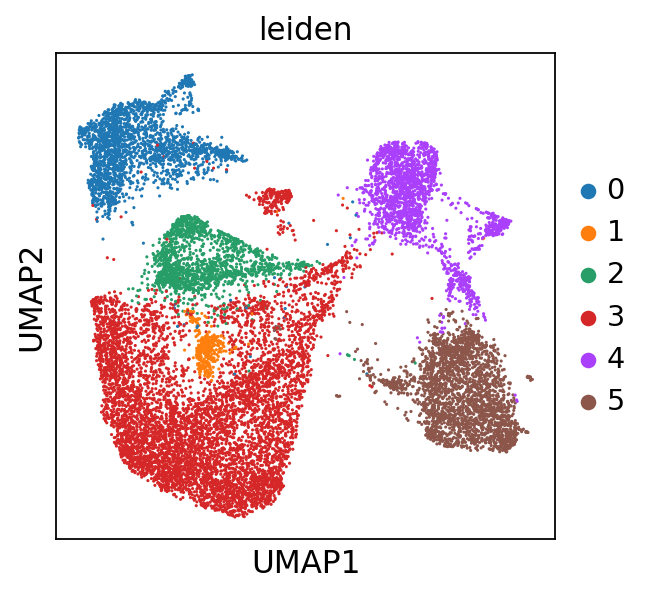

In [10]:
sc.pp.neighbors(mdata["gex"], n_neighbors = 50)
sc.tl.umap(mdata["gex"], min_dist=0.5, spread= 5.0)
sc.tl.leiden(mdata["gex"], resolution =0.2, n_iterations=-1, flavor = 'igraph')
sc.pl.umap(mdata["gex"], color=["leiden"])

running Leiden clustering
    finished (0:00:01)


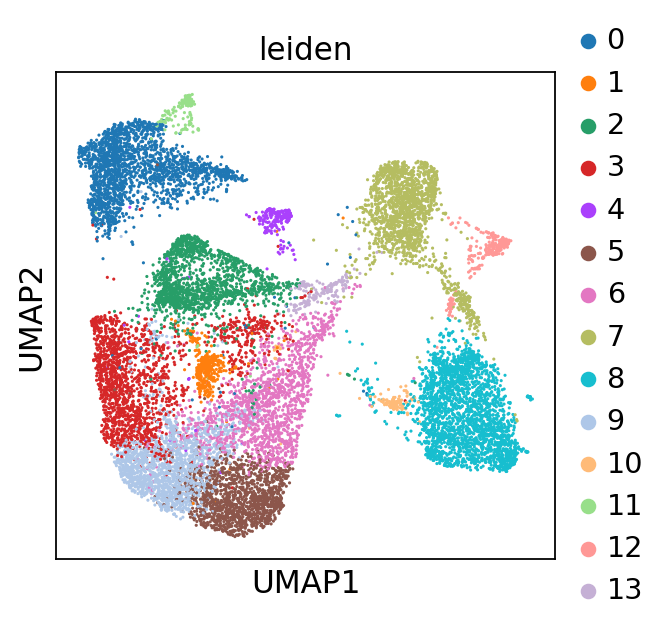

In [11]:
# sc.pp.neighbors(mdata["gex"], n_neighbors = 50)
# sc.tl.umap(mdata["gex"], min_dist=0.5, spread= 5.0)
sc.tl.leiden(mdata["gex"], resolution = 1, n_iterations=-1, flavor = 'igraph')
 # random_state = 42,
sc.pl.umap(mdata["gex"], color=["leiden"])

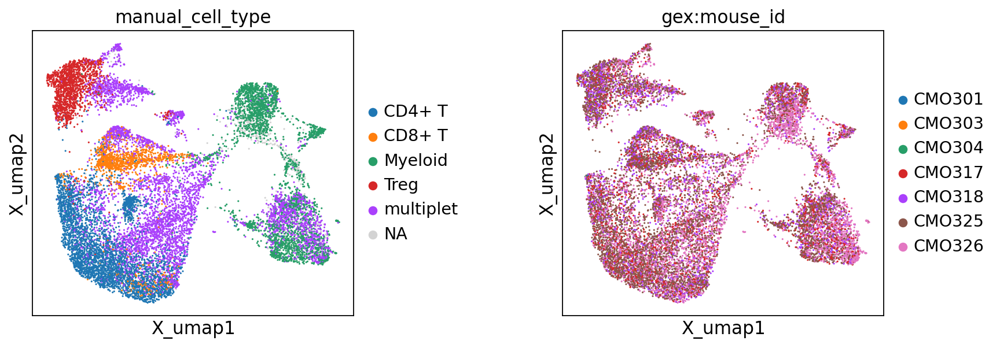

In [12]:
mu.pl.embedding(mdata, basis="gex:umap", color=['manual_cell_type','gex:mouse_id'], wspace = 0.5)

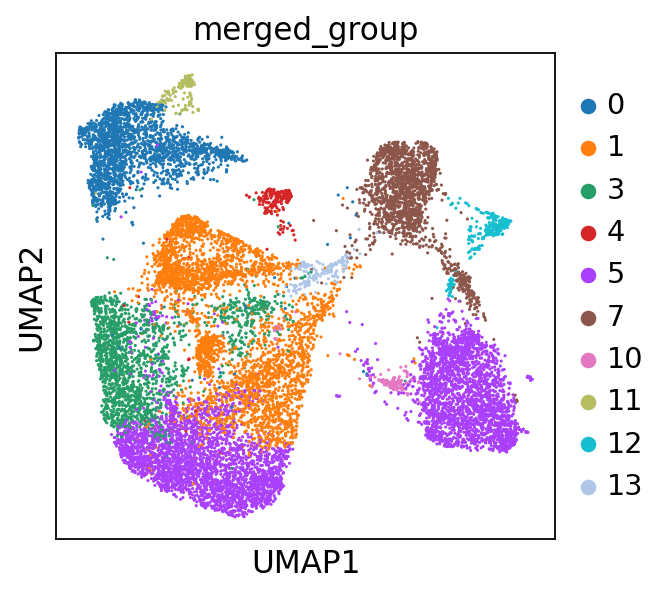

In [13]:
# List of clonotypes to analyze
mdata["gex"].obs["merged_group"] = mdata["gex"].obs["leiden"]

mdata["gex"].obs["merged_group"][mdata["gex"].obs["leiden"].isin(['1','2','6'])] = '1'
mdata["gex"].obs["merged_group"][mdata["gex"].obs["leiden"].isin(['5','8','9'])] = '5'

mdata["gex"].obs["merged_group"] = mdata["gex"].obs["merged_group"].cat.remove_unused_categories()

sc.pl.umap(mdata["gex"], color=["merged_group"])

# DEA among clusters

ranking genes
    finished (0:00:09)
    using 'X_pca' with n_pcs = 20
Storing dendrogram info using `.uns['dendrogram_leiden']`


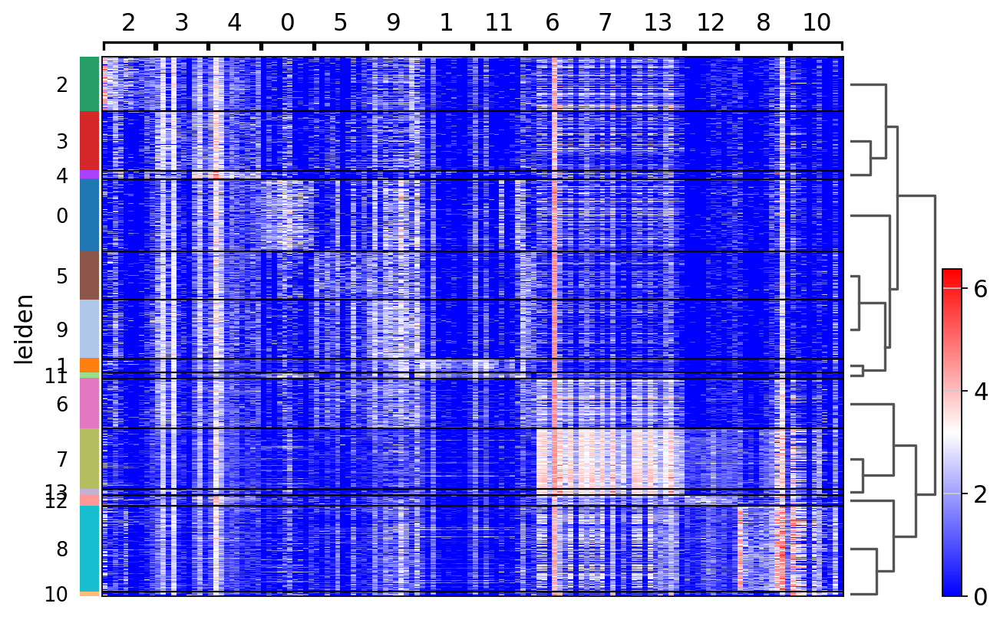

In [14]:
sc.tl.rank_genes_groups(mdata["gex"], groupby ="leiden", method="wilcoxon")

sc.pl.rank_genes_groups_heatmap(mdata["gex"], groupby = "leiden", 
                                n_genes=10, cmap='bwr',)



In [15]:
top_gene_leiden = mdata["gex"].uns['rank_genes_groups']['names'][0:20].tolist()
# 'scores', 'logfoldchanges', 'pvals', 'pvals_adj', 'pts'
com_genes = pd.DataFrame(top_gene_leiden)
com_genes

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,Foxp3,Hmgb2,Ccl5,Emb,Arhgap15,Cxcr6,Cxcr6,C1qc,Lyz2,Cxcr6,Cd74,H2az1,Gab2,C1qa
1,Tnfrsf18,Stmn1,Nkg7,Rpl12,Malat1,Tnfsf11,Bhlhe40,Hexb,Tgfbi,S100a10,H2-Aa,Stmn1,Dock4,C1qc
2,Ikzf2,H2az1,Ms4a4b,Il7r,Dock2,Bhlhe40,C1qc,C1qa,Cybb,Itgb1,H2-Eb1,Hmgb2,Slc8a1,Cd81
3,Tnfrsf4,Mki67,Gm2682,Rps7,Elmo1,Cd4,C1qa,Lgmn,Pla2g7,S100a6,Napsa,Mki67,Lrmda,C1qb
4,Ctla4,Pclaf,Ly6c2,Gm26740,Mbnl1,Capg,Cd81,C1qb,Cd14,S100a4,H2-Ab1,Pclaf,Zeb2,Ly86
5,Ifi27l2a,Top2a,Cd8b1,Vps37b,Dock10,Igfbp7,Tmsb4x,Cd81,Fcgr2b,Crip1,Ifi30,Il2ra,Plek,Ctsz
6,Il2ra,Smc2,Cd8a,Ramp3,Prkch,Il1r1,Cst3,Cst3,Cebpb,Vim,Ifitm1,Birc5,Mef2a,Hexb
7,Tnfrsf9,Birc5,Klrd1,Arhgap15,Ankrd44,S100a4,Ly86,Sparc,Apoe,Lgals1,Plbd1,Top2a,Lyn,Cst3
8,Izumo1r,Rrm2,Gramd3,Dock2,Inpp4b,Furin,C1qb,Ly86,Fth1,Ms4a4b,Ifitm3,Tnfrsf4,Qki,Grn
9,Glrx,Hmgn2,Epsti1,Grap2,Skap1,Il2rb,Sparc,Cx3cr1,Ms4a6c,Ly6a,Cbfa2t3,Lgals1,Picalm,Sparc


In [16]:
top_gene_leiden_score = mdata["gex"].uns['rank_genes_groups']['scores'][0:20].tolist()
com_genes_score = pd.DataFrame(top_gene_leiden_score)
com_genes_score

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,61.717487,31.835283,57.950745,33.944412,23.026285,38.187691,27.979954,63.100471,75.039505,36.613037,17.024532,19.811619,28.532787,19.367994
1,60.599155,31.619772,54.319820,33.919434,22.426954,35.935757,25.913965,62.659546,72.885841,31.756891,16.802076,19.133741,27.946106,19.342251
2,59.438068,30.803501,44.565712,33.450645,19.794832,32.479378,24.673586,62.200935,68.855537,31.057125,16.509125,18.528147,27.766825,19.205196
3,56.268940,30.251667,39.850861,31.128267,19.753946,29.548323,24.442410,61.834839,67.704384,30.339270,15.557896,18.189037,27.587204,19.166050
4,55.641911,29.354403,37.718582,24.342304,19.092415,27.930618,24.375860,61.781982,66.967430,30.199898,15.393834,17.983290,27.139389,18.457945
5,53.026993,28.371639,37.241589,23.670721,19.010605,26.213255,24.345837,61.709976,66.907272,29.758364,15.118061,17.810892,26.990013,18.389633
6,49.329300,27.609406,35.609524,23.480305,18.707718,25.528397,24.289976,61.267925,65.619766,29.531055,14.291056,17.424442,26.878498,18.277637
7,49.225056,27.431255,34.712383,23.218386,18.420729,25.311300,23.294111,61.183392,65.484261,28.703033,13.926975,17.252544,26.556047,18.118788
8,47.560810,26.492594,33.609985,22.563078,18.172224,24.571129,23.066422,60.113560,65.390869,28.212004,13.071800,16.567297,26.208960,18.075026
9,45.350903,26.406189,31.739346,19.321585,17.363161,23.825012,21.441263,60.010765,64.954994,26.049728,12.956502,16.476835,25.643963,17.776119


ranking genes
    finished (0:00:01)


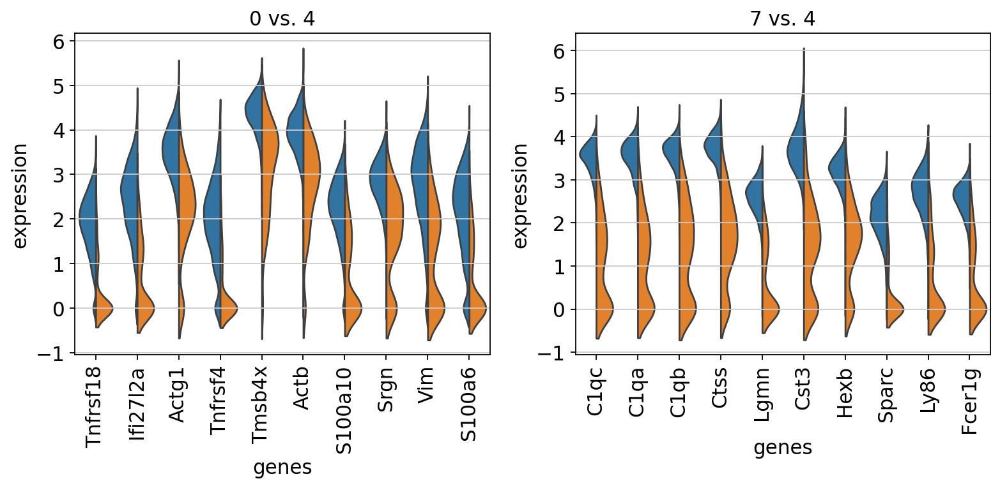

In [17]:
leiden_clusters = ['0','7']

sc.tl.rank_genes_groups(mdata["gex"], groupby ="merged_group", reference = '4',
                        groups = leiden_clusters, method="wilcoxon")

num_clonotypes = len(leiden_clusters)
num_cols = 2  # Number of columns in the figure
num_rows = int(np.ceil(num_clonotypes / num_cols))  # Number of rows based on total clonotypes

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 5))  
axs = axs.flatten()  # Flatten in case of multiple rows

# Generate violin plots for each clonotype
for ct, ax in zip(leiden_clusters, axs):
    sc.pl.rank_genes_groups_violin(mdata["gex"], groups=[ct], n_genes=10, ax=ax, show=False, strip=False)

# Remove any unused subplots
for i in range(len(leiden_clusters), len(axs)):
    fig.delaxes(axs[i])

plt.tight_layout()
plt.show()

### DAE in mergerd groups

ranking genes
    finished (0:00:00)
    using 'X_pca' with n_pcs = 20
Storing dendrogram info using `.uns['dendrogram_merged_group']`


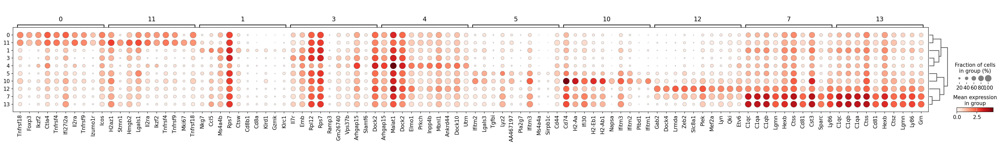

In [18]:
merged_clusters = ['0','7']

# groups = merged_clusters,
sc.tl.rank_genes_groups(mdata["gex"], groupby = "merged_group")
    
sc.pl.rank_genes_groups_dotplot(mdata["gex"], groupby = "merged_group", n_genes=10)
# sc.pl.dotplot(mdata["gex"], groupby = "merged_group",  genes=10)

 # groupby = "merged_group", groups = merged_clusters,

ranking genes
    finished (0:00:00)


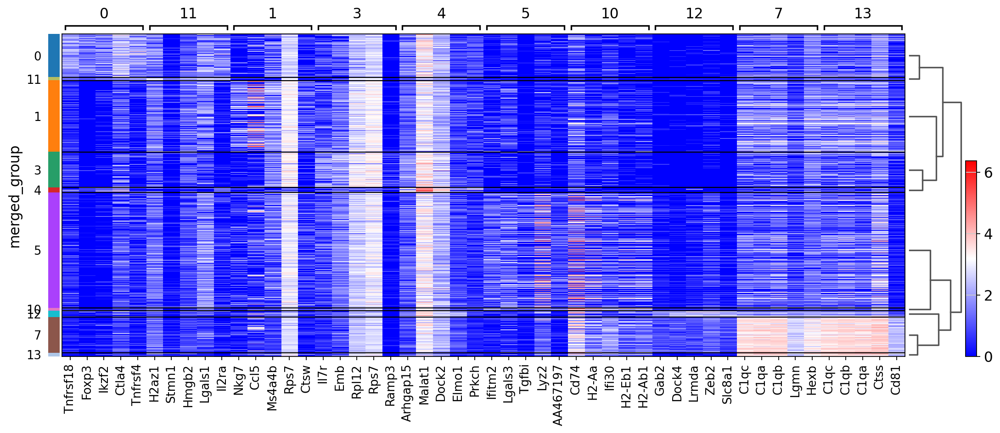

In [19]:
merged_clusters = ['0','7']
sc.tl.rank_genes_groups(mdata["gex"], groupby = "merged_group")
# groups = merged_clusters

sc.pl.rank_genes_groups_heatmap(mdata["gex"], groupby = "merged_group",
                                n_genes=5, cmap='bwr',)

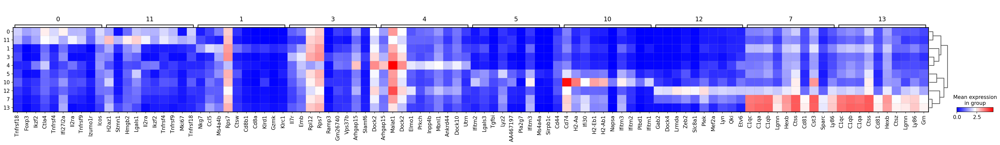

In [20]:
# logfold change
sc.pl.rank_genes_groups_matrixplot(mdata["gex"], groupby = "merged_group",
                                n_genes=10, cmap='bwr')

In [21]:
a = mdata["gex"].uns['rank_genes_groups']['names'][0:20].tolist()
com_genes = pd.DataFrame(a)
# com_genes

In [22]:
# sc.pl.dotplot(mdata["gex"], var_names=['Cd4', 'Runx1'], groupby='leiden')

# DEA among annotated cell types

In [23]:
cell_types = ['CD4+ T', 'CD8+ T', 'Treg']
mdata["gex"].obs['manual_cell_type'] = mdata.obs['manual_cell_type']

sc.tl.rank_genes_groups(
        mdata["gex"],
        "manual_cell_type",
        groups = cell_types,
        reference= "rest",
        method="wilcoxon"
    )


ranking genes
    finished (0:00:08)


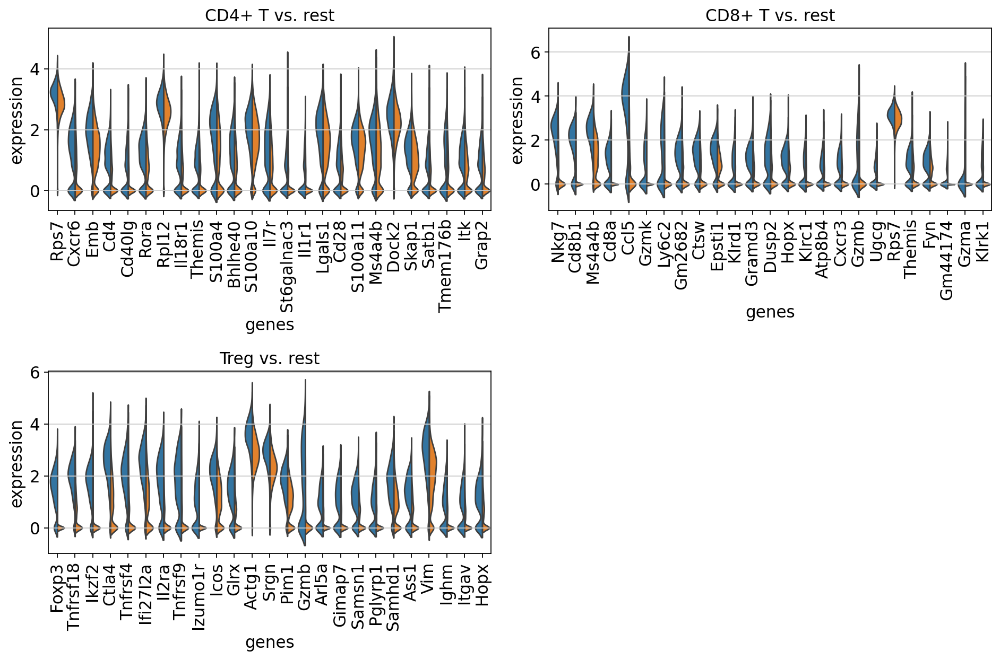

In [24]:
num_plots = len(cell_types)
num_cols = 2  # Number of columns in the figure
num_rows = int(np.ceil(num_plots / num_cols))  # Number of rows based on total clonotypes

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 6, num_rows * 4))  
axs = axs.flatten()  # Flatten in case of multiple rows

# Generate violin plots for each clonotype
for ct, ax in zip(cell_types, axs):
    sc.pl.rank_genes_groups_violin(mdata["gex"], groups=[ct], n_genes=25, ax=ax, show=False, strip=False)

# Remove any unused subplots
for i in range(len(cell_types), len(axs)):
    fig.delaxes(axs[i])

plt.tight_layout()
plt.show()
    

    using 'X_pca' with n_pcs = 20
Storing dendrogram info using `.uns['dendrogram_manual_cell_type']`
categories: CD4+ T, CD8+ T, Myeloid, etc.
var_group_labels: CD4+ T, CD8+ T, Treg


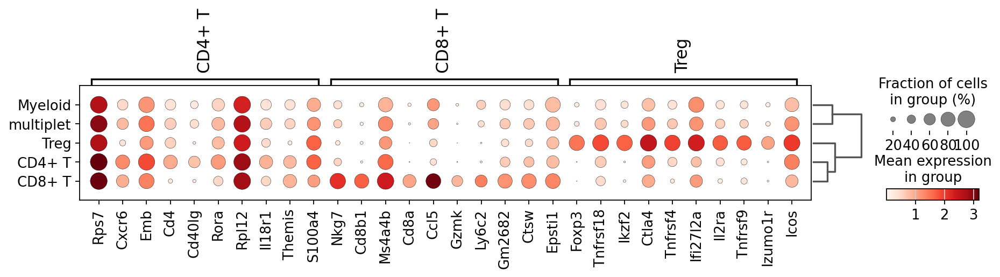

In [25]:
sc.pl.rank_genes_groups_dotplot(mdata["gex"], groupby='manual_cell_type', n_genes=10)

In [26]:
# ir.pp.index_chains(mdata)
# ir.tl.chain_qc(mdata)

In [27]:
# mu.pl.embedding(mdata, basis="gex:umap", color=['Cd4'], wspace = 0.5, ncols=2)

### T cell subset markers

In [28]:
target_genes = [gene for gene in mdata["gex"].var_names if gene.startswith("Lta")]
target_genes

['Lta']

In [29]:
# markers for CD4+
# select from DEA

# set 1: human markers 
# <Reinvestigation of Classic T Cell Subsets and Identification of Novel Cell Subpopulations by Single-Cell RNA Sequencing>
# naive_markers = ['Ccr7', 'Lef1', "Sell"]
# cd4_mem_markers = ['Tnfrsf4', 'Timp1', "Usp10"]
# cd8_Eff_Mem_markers = ['Cd45ra', 'Fgfbp2', "Gzmh", "Gzmb"]
# Mait_markers = ["Klrb1", "Ncr3", "Zbtb16", 'Rorc']


# set 2: mouse markers
# <Single-Cell RNA Sequencing of the T Helper Cell Response to House Dust Mites Defines a Distinct Gene Expression Signature in Airway Th2 Cells>
Th2_markers = ['Gata3', 'Il13', "Il5", "Il1rl1", "Plac8", "Igfbp7"]
Th1_markers = ['Cxcr3', 'Ccl5', "Tbx21"]
Activated_markers = ['Tcf7', 'S1pr1', "Trat1", "Tmem176a"]
Treg_markers = ["Foxp3", "Ctla4", "Il10", "Klrg1", "Folr4", "Il2ra"]

sorting_marker = ["Cd3", "Cd4", "Cd44", "St2", "Cd25"]


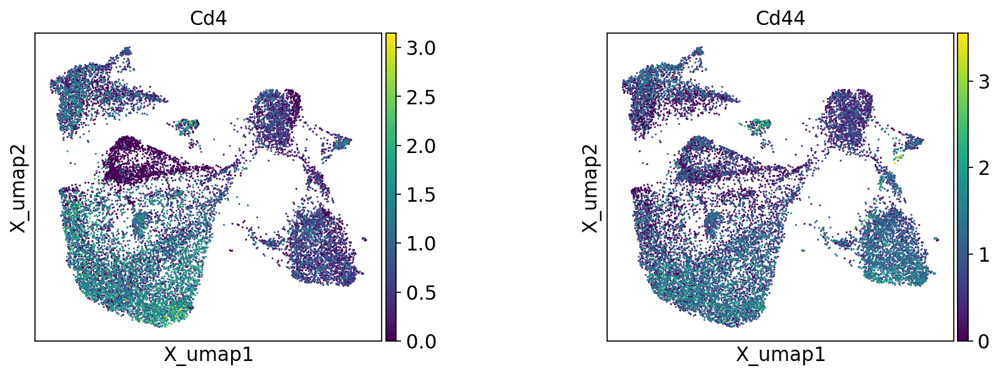

In [30]:
markers_in = []
for i in sorting_marker:
    if i in mdata["gex"].var_names:
        markers_in.append(i) 

mu.pl.embedding(mdata, basis="gex:umap", color= markers_in, wspace = 0.5, ncols=2, vmin=0)

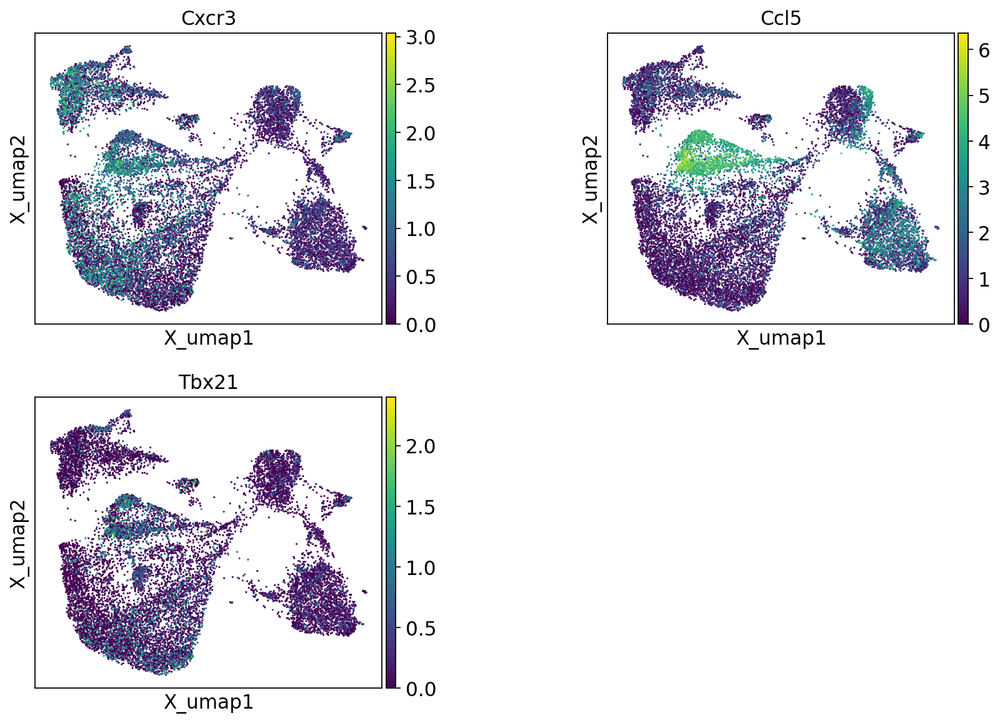

In [31]:
markers_in = []
for i in Th1_markers:
    if i in mdata["gex"].var_names:
        markers_in.append(i) 
markers_in

mu.pl.embedding(mdata, basis="gex:umap", color= markers_in, wspace = 0.5, ncols=2, vmin=0)

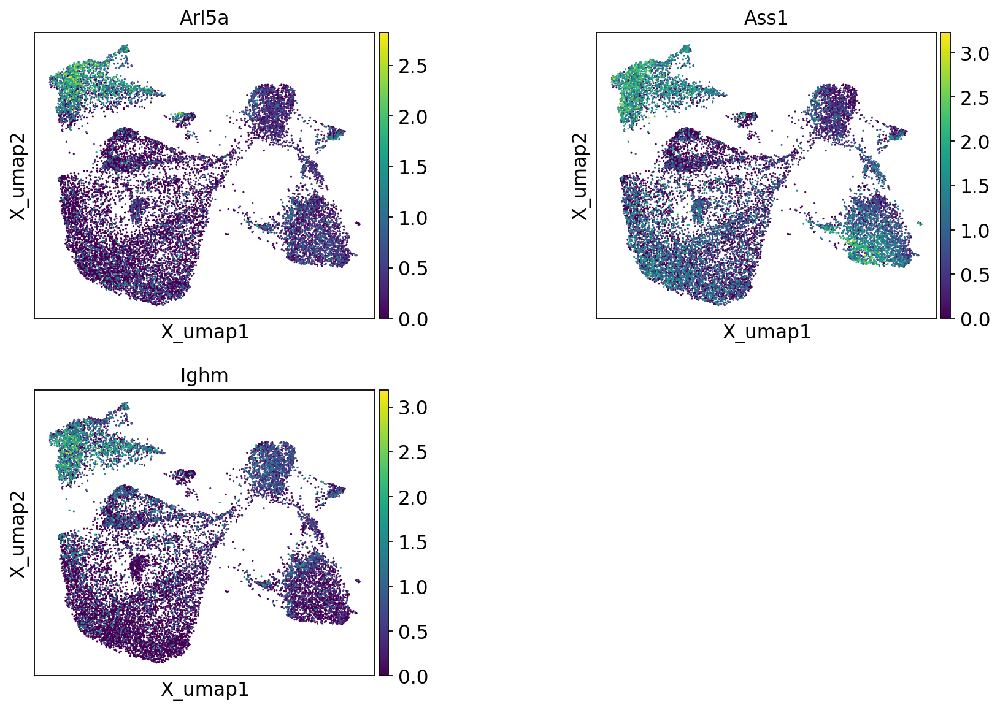

In [32]:
# from top DAE
mu.pl.embedding(mdata, basis="gex:umap", color=com_genes.iloc[-4:-1,0], wspace = 0.5, ncols=2)

In [33]:
# in_mem_cluster = mdata["gex"].obs["leiden"].isin([ "0", "1"])

# mdata.obs["manual_cell_type"][in_mem_cluster] = mdata.obs["manual_cell_type"] + "_mem"
# mdata.obs["manual_cell_type"][in_mem_cluster] = mdata.obs["manual_cell_type"][in_mem_cluster]+ "_mem"

# for i in range(len(mdata)):
#     if mdata.obs["manual_cell_type"][i][-4:] == "_mem":
#         mdata.obs["manual_cell_type"][i] = mdata.obs["manual_cell_type"][i][:-4]

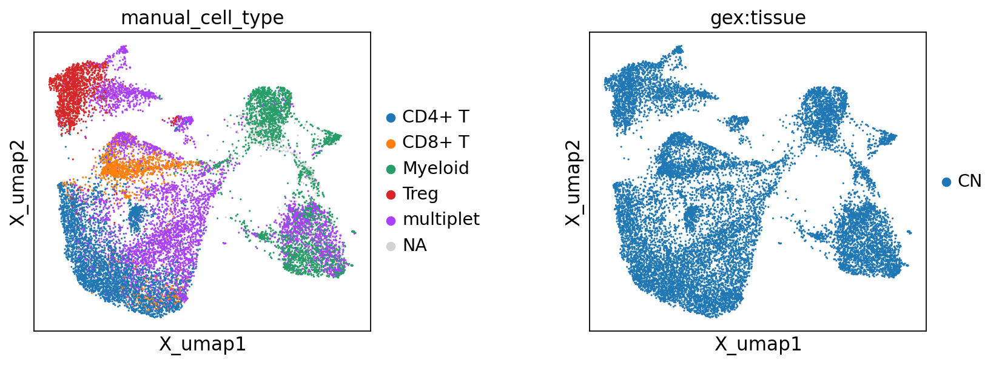

In [34]:
mu.pl.embedding(mdata, basis="gex:umap", color=['manual_cell_type','gex:tissue'], wspace = 0.5)

In [35]:
# another ploting commd
# fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 4), gridspec_kw={"wspace": 0.5})
# mu.pl.embedding(mdata, basis="gex:umap", color=["Cd3e"], ax=ax0, show=False)
# mu.pl.embedding(mdata, basis="gex:umap", color=["airr:receptor_type"], ax=ax1)

In [36]:
# mdata.write("0605_SPL_Clustered_GEX_Top2000.h5mu")

# subset in CD4

In [37]:
 # mdata[mdata.mod["gex"].obs["tissue"].isin(["SP"]) ]

In [38]:
cd4_set = mdata[mdata.obs["manual_cell_type"].isin(["CD4+ T", "CD4+ T_mem"])]

In [39]:
cd4_set.obs["manual_cell_type"].value_counts()

manual_cell_type
CD4+ T       3770
CD8+ T          0
Myeloid         0
Treg            0
multiplet       0
Name: count, dtype: int64

In [40]:
sc.pp.pca(cd4_set["gex"], svd_solver="arpack", n_comps=20)

computing PCA
    with n_comps=20
    finished (0:00:00)


computing neighbors
    using 'X_pca' with n_pcs = 20


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fa923df0a40>
Traceback (most recent call last):
  File "/ihome/crc/install/python/ondemand-jupyter-python3.11-2023.09/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/ihome/crc/install/python/ondemand-jupyter-python3.11-2023.09/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/ihome/crc/install/python/ondemand-jupyter-python3.11-2023.09/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/ihome/crc/install/python/ondemand-jupyter-python3.11-2023.09/lib/python3.11/site-packages

    finished (0:00:00)
computing UMAP
    finished (0:00:09)
running Leiden clustering
    finished (0:00:00)


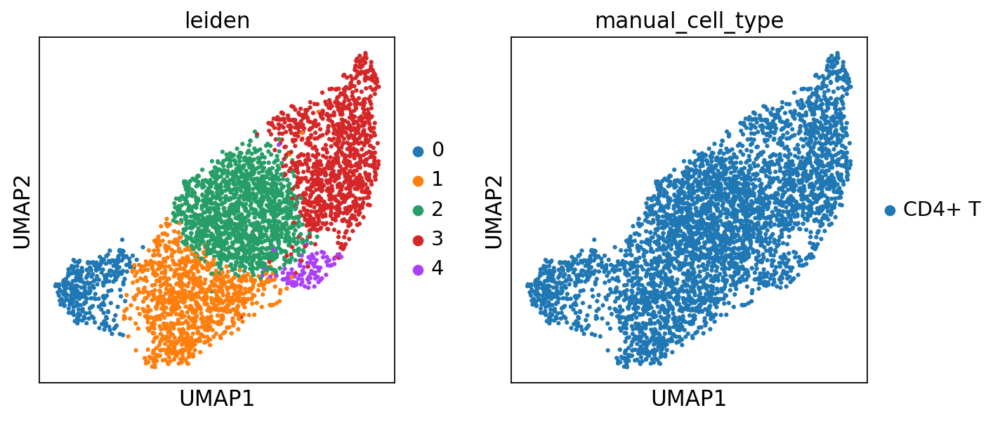

In [41]:
sc.pp.neighbors(cd4_set["gex"], n_neighbors = 20)
sc.tl.umap(cd4_set["gex"], min_dist=0.5, spread=1.0)
sc.tl.leiden(cd4_set["gex"], resolution = 0.5, n_iterations=2, flavor = 'igraph')
sc.pl.umap(cd4_set["gex"], color=["leiden", "manual_cell_type"])

In [42]:
# sc.pp.neighbors(cd4_set["gex"], n_neighbors = 50)
# sc.tl.umap(cd4_set["gex"], min_dist=0.5, spread=5.0)
# sc.tl.leiden(cd4_set["gex"], resolution = 1, n_iterations= -1, flavor = 'igraph')
# sc.pl.umap(cd4_set["gex"], color=["leiden", "manual_cell_type"])


In [43]:
# leiden_groups = list(set(cd4_set["gex"].obs["leiden"])
L = int(max(cd4_set["gex"].obs['leiden']))
leiden_groups = [str(x) for x in range(L+1)]

sc.tl.rank_genes_groups(
        cd4_set["gex"],
        "leiden",
        groups = leiden_groups,
        reference= "rest",
        method="wilcoxon"
    )

ranking genes
    finished (0:00:01)


    using 'X_pca' with n_pcs = 20
Storing dendrogram info using `.uns['dendrogram_leiden']`


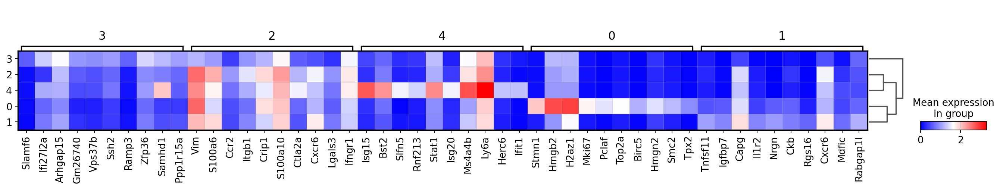

In [44]:
# Dynamically determine the number of rows/columns for subplots
sc.tl.dendrogram(cd4_set["gex"], groupby='leiden',)
sc.pl.rank_genes_groups_matrixplot(cd4_set["gex"], groupby='leiden', n_genes=10, cmap='bwr')

In [45]:
target_genes = [gene for gene in cd4_set["gex"].var_names if gene.startswith("Bcl")]
target_genes

['Bcl2', 'Bcl9', 'Bcl2l14', 'Bcl2a1a', 'Bcl11a', 'Bcl11b']

In [46]:
# set 1: human markers
# <Current annotation strategies for T cell phenotyping of single-cell RNA-seq data>
# Th1_markers = ['Ccl5', 'Ccr1', 'Cxcr3', 'Tnfa', 'Cd3', 'Il2']
# Th2_markers = ['Cd3', 'Ccr3', 'Ccr8', 'Gata3', 'Il5', 'Il4']
# Th17_markers = ['Il17a', 'Il17f', 'Il17', 'Il7r', 'Il5', 'Il4']
# cd4_markers = ['Ly6a', 'Cd40lg']

# set 2: mouse markers
# <Single-Cell RNA Sequencing of the T Helper Cell Response to House Dust Mites Defines a Distinct Gene Expression Signature in Airway Th2 Cells>
Th1_markers = ['Tbx21', 'Ccl5', 'Cxcr3', 'Ifng', 'Gzmk', "Il2", "Lta", "Tnf", 'Il12rb2']
# not exclusive genes: 'Stat4', 'Stat1', 'Ms4a4b', 
Th2_markers = ['Gata3', 'Il13', 'Il1rl1', 'Plac8', 'Il5', 'Igfbp7', "Il4", "Ccr4", "Ccl17", "Stat6"]
activated_markers = ['Tcf7', 'S1pr1', 'Trat1', 'Klf2', 'Tmem176a', 'Tmem176b']
Treg_markers = ['Foxp3', 'Ctla4', 'Il2ra', "Ikzf2", 'Il10', 'Klrg1',  'Folr4', "Cd39"]
Th17_markers = ['Rorc', 'Il17a', 'Il17f', 'Il23r', 'Ccr6', 'Itgae', 'Furin', 'Ctsh', "Il21", "Stat3"]
Tfh_markers = ["Bcl6", "Cxcr5", "Pdcd1", "Icos", "Il21", "Sap", "Cd40lg", ""]
#


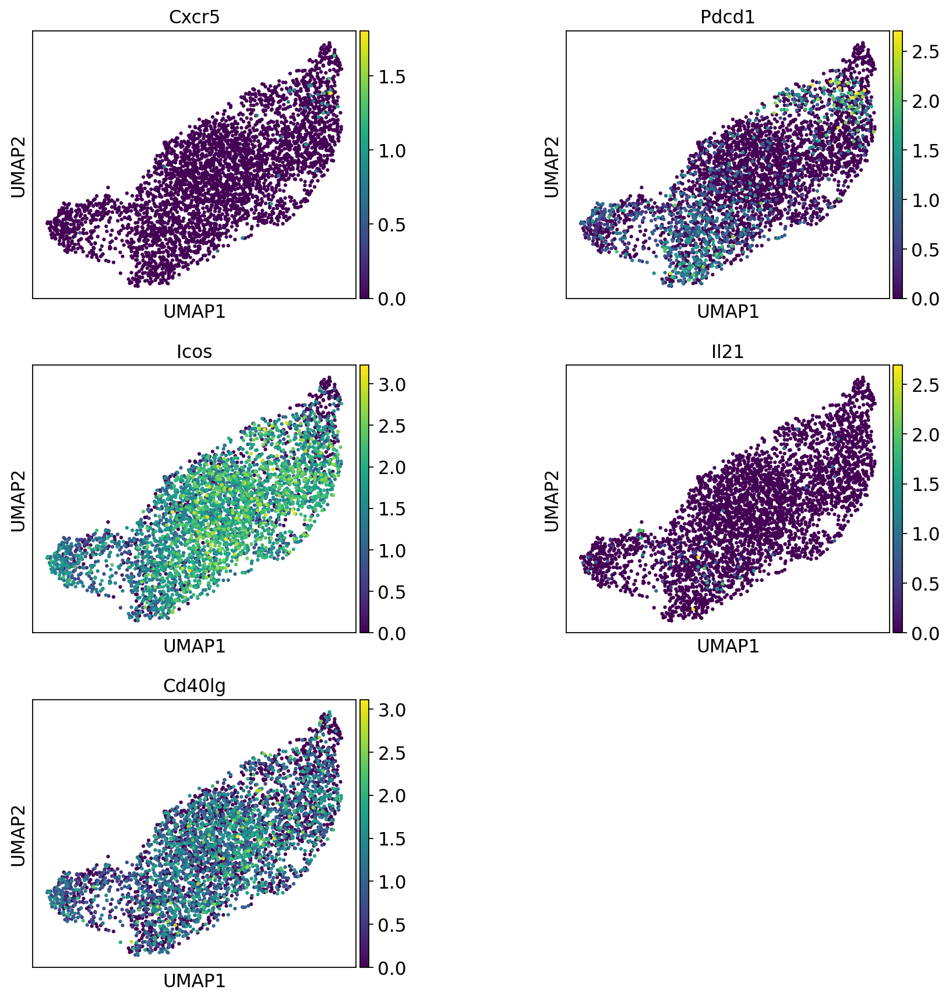

In [47]:
markers_in = []
for i in Tfh_markers:
    if i in cd4_set["gex"].var_names:
        markers_in.append(i) 
markers_in

mu.pl.embedding(cd4_set["gex"], basis="umap", color= markers_in,  wspace = 0.5, ncols=2, vmin=0)

In [48]:
top_gene_by_type = cd4_set["gex"].uns['rank_genes_groups']['names'][0:20].tolist()
com_genes = pd.DataFrame(top_gene_by_type)
com_genes

,0,1,2,3,4
0,Stmn1,Tnfsf11,Vim,Slamf6,Isg15
1,Hmgb2,Igfbp7,S100a6,Ifi27l2a,Bst2
2,H2az1,Capg,Ccr2,Arhgap15,Slfn5
3,Mki67,Il1r2,Itgb1,Gm26740,Rnf213
4,Pclaf,Nrgn,Crip1,Vps37b,Stat1
5,Top2a,Ckb,S100a10,Ssh2,Isg20
6,Birc5,Rgs16,Ctla2a,Ramp3,Ms4a4b
7,Hmgn2,Cxcr6,Cxcr6,Zfp36,Ly6a
8,Smc2,Mdfic,Lgals3,Samhd1,Herc6
9,Tpx2,Rabgap1l,Ifngr1,Ppp1r15a,Ifit1


# keep subsetting

In [49]:
cd4_subset1 = cd4_set["gex"][cd4_set["gex"].obs["leiden"].isin(["0","1","4"])]

In [50]:
sc.pp.pca(cd4_subset1, svd_solver="arpack", n_comps=20)

computing PCA
    with n_comps=20
    finished (0:00:00)


computing neighbors
    using 'X_pca' with n_pcs = 20


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fa923df0a40>
Traceback (most recent call last):
  File "/ihome/crc/install/python/ondemand-jupyter-python3.11-2023.09/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/ihome/crc/install/python/ondemand-jupyter-python3.11-2023.09/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/ihome/crc/install/python/ondemand-jupyter-python3.11-2023.09/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/ihome/crc/install/python/ondemand-jupyter-python3.11-2023.09/lib/python3.11/site-packages

    finished (0:00:00)
computing UMAP
    finished (0:00:03)
running Leiden clustering
    finished (0:00:00)


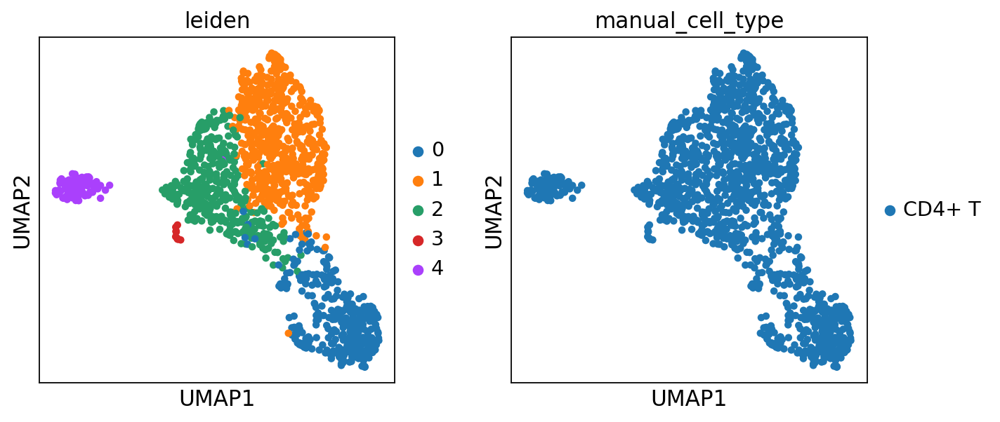

In [51]:
sc.pp.neighbors(cd4_subset1, n_neighbors = 20)
sc.tl.umap(cd4_subset1, min_dist=0.2, spread=2.0)
sc.tl.leiden(cd4_subset1, resolution = 0.5, n_iterations=2, flavor = 'igraph')
sc.pl.umap(cd4_subset1, color=["leiden", "manual_cell_type"])

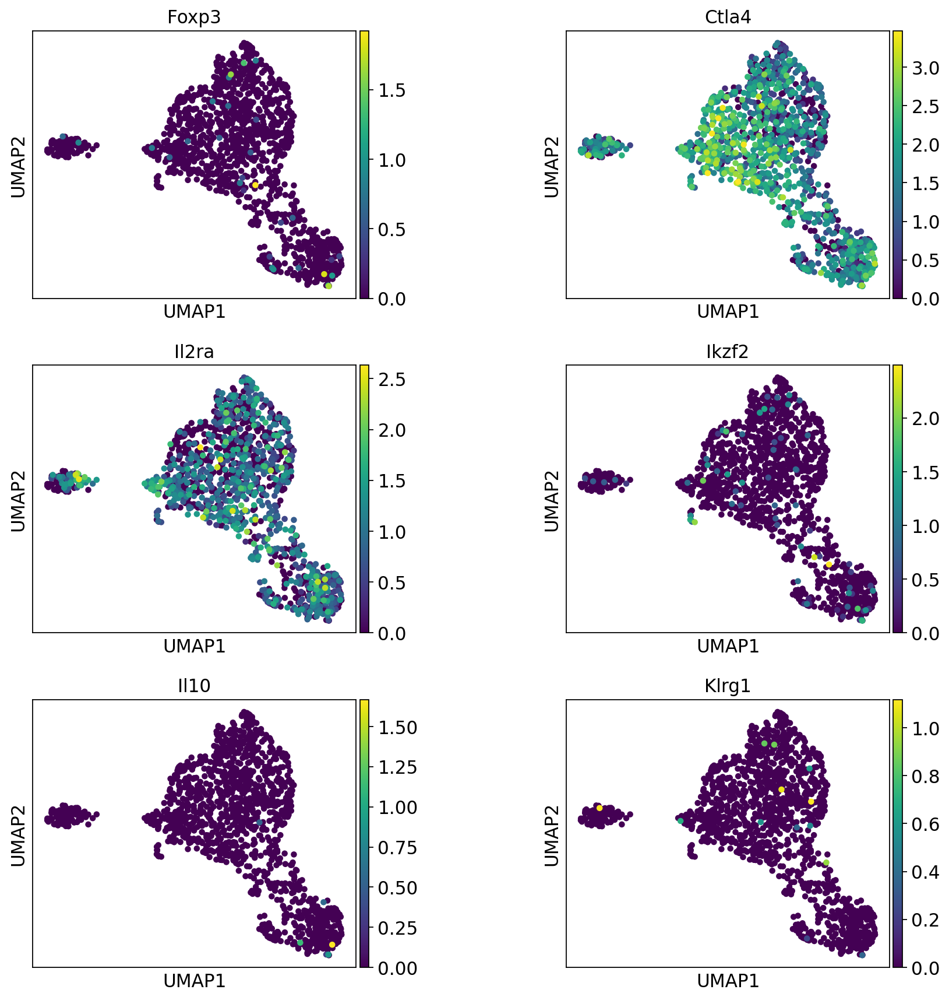

In [52]:
markers_in = []
for i in Treg_markers:
    if i in cd4_subset1.var_names:
        markers_in.append(i) 
markers_in

mu.pl.embedding(cd4_subset1, basis="umap", color= markers_in,  wspace = 0.5, ncols=2)

## compare with ref set

In [53]:
cluster_data = []
# 'pvals_adj', 'pts'

top_L = 100
topGene_names = pd.DataFrame(cd4_set["gex"].uns['rank_genes_groups']['names'][0:top_L].tolist())
topGene_scores = pd.DataFrame(cd4_set["gex"].uns['rank_genes_groups']['scores'][0:top_L].tolist())
topGene_LF = pd.DataFrame(cd4_set["gex"].uns['rank_genes_groups']['logfoldchanges'][0:top_L].tolist())
topGene_pvals = pd.DataFrame(cd4_set["gex"].uns['rank_genes_groups']['pvals'][0:top_L].tolist())

metrics = ['gene', 'scores', 'avg_logFC', 'pvals']
metrics_df = [topGene_names, topGene_pvals, topGene_scores, topGene_LF]

clusters_list = []
for i in range(L+1):
    cluster_dict = {}
    for j in range(len(metrics)):
        cluster_dict[metrics[j]] = metrics_df[j].iloc[:,i]
    clusters_list.append(cluster_dict)


In [54]:
%cd ../../../Data processing/data/ref_snRNA/1

/ihome/ylee/yiz133/Code/Data processing/data/ref_snRNA/1


In [55]:
import pickle
with open('Cd4_p.pkl', 'rb') as file:
    cluster_metric_ref = pickle.load(file)
metric_selected = 'avg_logFC'
ref_types = len(cluster_metric_ref)

# cluster_metric_ref = pd.read_csv('Th17.csv')
# metric_selected = 'effect_size'
# ref_types = 1

In [56]:
# intersect genes
corr_mat = np.zeros([L+1, ref_types])
common_gene_num = np.zeros([L+1, ref_types])

common_genes_L = []

for i in range(L+1):
    for j in range(ref_types):
        
        # multi tab
        ref_cluster = cluster_metric_ref[str(j+1)].loc[:, [metric_selected, 'gene']]
        # 'gene', 'scores', 'avg_logFC', 'pvals']
        
        # single tab
        # ref_cluster = cluster_metric_ref.loc[:, [metric_selected, 'gene']]
        
        n_genes = min(top_L, len(ref_cluster))
        ref_cluster = ref_cluster.sort_values(by= metric_selected, ascending=False)
        ref_cluster = ref_cluster.iloc[:n_genes]

        c1 = pd.DataFrame(clusters_list[i]).iloc[:n_genes, [0,2]]
        c2 = pd.DataFrame(ref_cluster)
        
        common_genes = pd.merge(c1, c2, on='gene', how='inner')
        corr_mat[i][j] = common_genes.iloc[:,1].corr(common_genes.iloc[:,2], method='kendall')
        common_gene_num[i][j] = len(common_genes)
        
        common_genes_L.append(common_genes)
    
pd.DataFrame(corr_mat)

,0,1,2,3,4,5
0,NaN,NaN,NaN,-0.333333,NaN,NaN
1,-0.200000,-1.000000,1.000000,0.142857,-0.066667,NaN
2,-0.277778,0.428571,0.466667,0.183333,-0.055556,-0.111111
3,-1.000000,-0.055556,NaN,NaN,0.071429,-0.066667
4,0.066667,NaN,NaN,0.333333,1.000000,0.347594


In [57]:
markers_in = common_genes_L[0]['gene'].to_list()
mu.pl.embedding(cd4_set["gex"], basis="umap", color= markers_in, wspace = 0.5, ncols=2)

ValueError: Could not broadast together arguments with shapes: [0, 1, 1].

In [ ]:
common_genes_L[0]

In [ ]:
common_genes_L[4]

In [ ]:
# top_gene_all = cd4_set["gex"].uns['rank_genes_groups']['names'].tolist()
# top_gene_all_df = pd.DataFrame(top_gene_all)

# search_gene = "Ccl5"
# mask = top_gene_all_df.isin([search_gene])

# matching_indices = top_gene_all_df.index[mask.any(axis=1)].tolist()

# print(matching_indices)

# batch effect


In [ ]:
mdata_ori = mu.read("common_GEX_TCR_QC_mdata.h5mu")
mdata_ori

In [ ]:
# exclude 2D2 transfer samples

selected_samples_id = ["CMO301", "CMO302", "CMO318", "CMO325", "CMO323"]
selected_date = ["0516"]
selected_tissue = ["CN"]

mdata = mdata_ori[~ (mdata_ori.mod["gex"].obs["mouse_id"].isin(selected_samples_id) & mdata_ori.mod["gex"].obs["date"].isin(selected_date))]

# positive select
# mdata = mdata[mdata.mod["gex"].obs["sample"].isin(["SPL_0605"]) ]
mdata

In [ ]:
# mdata.obs["sample"] = mdata.obs["sample"].cat.remove_unused_categories()
# mdata.obs["manual_cell_type"] = mdata.obs["manual_cell_type"].cat.remove_unused_categories()
# mdata.obs["celltype_sample"] = (
#     mdata.obs["manual_cell_type"].astype(str) + "_" + mdata.obs["sample"].astype(str)
# )

In [ ]:
fig, ax0 = plt.subplots(1, 1, figsize=(8,8))
# mu.pl.embedding(mdata_ori, basis="gex:umap", ax=ax0)

mask = mdata_ori['gex'].obs['tissue'] == 'SP'

mu.pl.embedding(mdata_ori, basis="gex:umap", color=['gex:mouse_id'], mask_obs=mask, ax=ax0)

In [ ]:
mdata["gex"].obs["mouse_id"].value_counts()

In [ ]:
import bbknn
bbknn.bbknn(mdata["gex"], batch_key="mouse_id", use_annoy=False)

In [ ]:
sc.tl.umap(mdata["gex"])

In [ ]:
mu.pl.embedding(mdata, basis="gex:X_umap", color = ["gex:mouse_id", "manual_cell_type"], wspace = 0.5)


In [ ]:
# alternative plot commmand


# fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5), gridspec_kw={"wspace": 1})
# sc.pl.umap(mdata["gex"], color=["mouse_id"])
# mdata["gex"].obs["manual_cell_type"] = mdata.obs["manual_cell_type"]

# sc.pl.umap(mdata["gex"], color=["manual_cell_type"])


In [ ]:
# Using the igraph implementation and a fixed number of iterations can be significantly faster, especially for larger datasets
sc.tl.leiden(mdata["gex"], resolution = 0.5, n_iterations=2, flavor = 'igraph')
sc.pl.umap(mdata["gex"], color=["leiden"])

In [ ]:
mdata["gex"].obs["leiden"]

# Save Filtered TCR table

In [ ]:
mdata = mu.read("common_GEX_TCR_mdata.h5mu")
mdata

In [ ]:
adata_tcr = mdata.mod['airr']
adata_tcr.obsm["airr"][0]

In [ ]:
meta_DF = ir.get.airr(adata_tcr, ["cdr3_aa", "consensus_count", "v_call", "j_call"] ,  ('VJ_1', 'VDJ_1'))

# , "high_confidence","productive"

# ('VJ_1', 'VDJ_1', 'VJ_2', 'VDJ_2'), 

meta_DF.iloc[0:10,:]

In [ ]:
meta_DF["VDJ_1_j_call"].value_counts()

In [ ]:
# meta_DF.to_csv('primary_TCR.csv', index=True)